In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [ ]:
sns.boxplot(cloud_cover['cloud_cover'])

In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

# Train/Test Model

In [10]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [11]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [12]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [13]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,5)

X_train Shape : (12043, 5, 1)
y_train Shape : (12043, 1)
X_test Shape :  (3013, 5, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [14]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [15]:
test1 = test.copy()

In [31]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 6s 6ms/step - loss: 0.0217 - val_loss: 0.0039
Epoch 2/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0025 - val_loss: 0.0036
Epoch 3/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0023 - val_loss: 0.0034
Epoch 4/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0021 - val_loss: 0.0032
Epoch 5/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 6/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 7/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 8/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 9/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 10/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0025

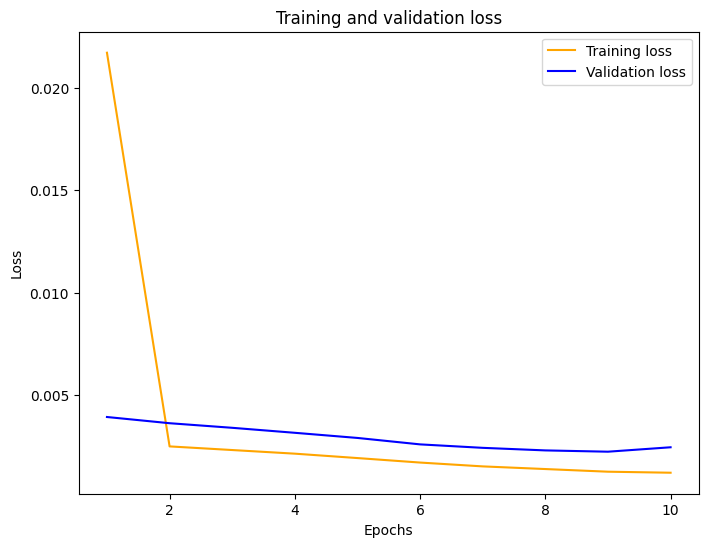

In [32]:
plot_curve(hist_adam)

In [33]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.584601,0.560451
1,2021-12-10 15:25:00,0.588,0.556181,0.545495
2,2021-12-10 15:26:00,0.566,0.579224,0.597995
3,2021-12-10 15:27:00,0.562,0.587481,0.572805
4,2021-12-10 15:28:00,0.612,0.585501,0.567611
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.179594,0.172309
3009,2021-12-16 13:59:00,0.169,0.179030,0.172223
3010,2021-12-16 14:00:00,0.147,0.179203,0.173237
3011,2021-12-16 14:01:00,0.145,0.168763,0.151936


In [34]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [35]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mape_error_unit_50_adam = mape(test1['cloud_cover'], test1['LSTM_adam'])
lstm_mse_error_unit_50_adam


0.0024456759884788084

In [39]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'The frist layer', 'The frist layer add Drop out', 'The second layer', 'The second layer add Drop out', 
                                 'The third layer', 'The output layer', 'epochs','MSE error','MAPE error'])

data = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'MSE error':lstm_mse_error_unit_50_adam, 'MAPE error' : lstm_mape_error_unit_50_adam} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_10344\3523206563.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,MSE error,MAPE error
0,5,Adam,32,,50,,,,,1,10,0.002446,NaN


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [26]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 10s 9ms/step - loss: 0.0078 - val_loss: 0.0031
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0020 - val_loss: 0.0029
Epoch 3/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0016 - val_loss: 0.0027
Epoch 4/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0025
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0010 - val_loss: 0.0

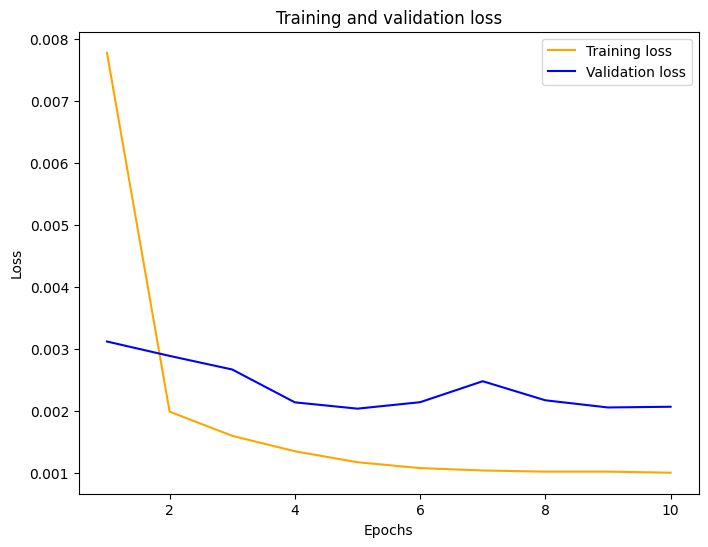

In [27]:
plot_curve(hist_50_rms)

In [28]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.563009,0.560451
1,2021-12-10 15:25:00,0.588,0.538731,0.545495
2,2021-12-10 15:26:00,0.566,0.566801,0.597995
3,2021-12-10 15:27:00,0.562,0.570444,0.572805
4,2021-12-10 15:28:00,0.612,0.566026,0.567611
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.171282,0.172309
3009,2021-12-16 13:59:00,0.169,0.170707,0.172223
3010,2021-12-16 14:00:00,0.147,0.171001,0.173237
3011,2021-12-16 14:01:00,0.145,0.159202,0.151936


In [29]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [26]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.002086386382956052


,Model,MSE error
0,model,0.002086
1,model_1,0.002107


In [35]:
data1 = [{'Lags':5 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_rms}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\3520925594.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [28]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
189/189 [==============================] - 7s 12ms/step - loss: 0.0163 - val_loss: 0.0035
Epoch 2/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0022 - val_loss: 0.0034
Epoch 3/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0022 - val_loss: 0.0033
Epoch 4/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0021 - val_loss: 0.0032
Epoch 5/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0020 - val_loss: 0.0031
Epoch 6/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 7/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 8/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 9/10
189/189 [==============================] - 1s 8ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 10/10
189/189 [==============================] - 1s 7ms/step - loss: 0.0015 - val_loss: 0.002

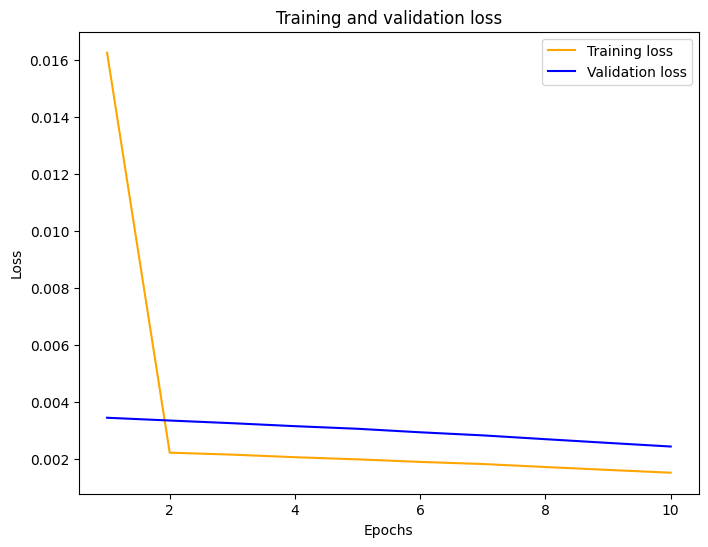

In [29]:
plot_curve(hist_batch_size64)

In [30]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.559884,0.538379,0.591048
1,2021-12-10 15:25:00,0.588,0.535103,0.524593,0.564696
2,2021-12-10 15:26:00,0.566,0.565074,0.577768,0.567558
3,2021-12-10 15:27:00,0.562,0.570363,0.553792,0.563658
4,2021-12-10 15:28:00,0.612,0.566468,0.548355,0.562180
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.170361,0.168293,0.168685
3009,2021-12-16 13:59:00,0.169,0.169792,0.168260,0.168398
3010,2021-12-16 14:00:00,0.147,0.170089,0.169249,0.168486
3011,2021-12-16 14:01:00,0.145,0.158179,0.147967,0.160987


In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [32]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.002086386382956052


,Model,MSE error
0,model,0.002086
1,model_1,0.002431


In [36]:
data2 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_batch_size64}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\3214047945.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431


---

### learning rate 0.1

In [37]:
test2 = test.copy()

#### Add frist layer: units = 50

In [38]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 12ms/step - loss: 0.0667 - val_loss: 0.0023
Epoch 2/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 4/10
377/377 [==============================] - 7s 19ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 6/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0025
Epoch 7/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.

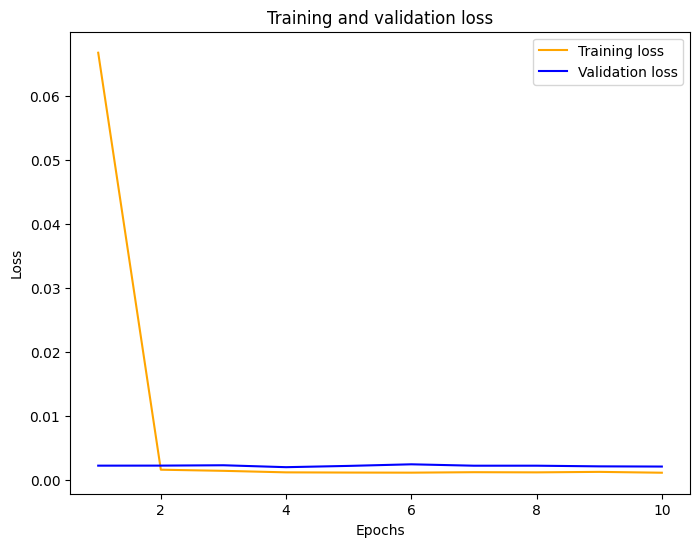

In [39]:
plot_curve(hist_01)

In [40]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.552340
1,2021-12-10 15:25:00,0.588,0.536828
2,2021-12-10 15:26:00,0.566,0.596869
3,2021-12-10 15:27:00,0.562,0.568668
4,2021-12-10 15:28:00,0.612,0.565224
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172678
3009,2021-12-16 13:59:00,0.169,0.172585
3010,2021-12-16 14:00:00,0.147,0.173561
3011,2021-12-16 14:01:00,0.145,0.153278


In [41]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [42]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.002086386382956052


,Model,MSE error
0,model,0.002086
1,model_1,0.002102


In [43]:
data3 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_01}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\3849112779.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [44]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 9ms/step - loss: 0.0036 - val_loss: 0.0021
Epoch 2/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 3/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 6/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0

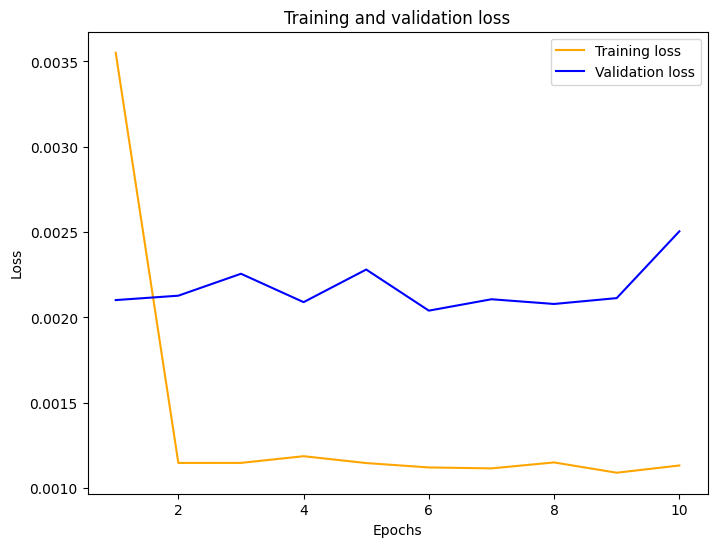

In [45]:
plot_curve(hist_005)

In [46]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.552340,0.572877
1,2021-12-10 15:25:00,0.588,0.536828,0.550299
2,2021-12-10 15:26:00,0.566,0.596869,0.620029
3,2021-12-10 15:27:00,0.562,0.568668,0.572293
4,2021-12-10 15:28:00,0.612,0.565224,0.581529
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172678,0.171658
3009,2021-12-16 13:59:00,0.169,0.172585,0.172241
3010,2021-12-16 14:00:00,0.147,0.173561,0.173663
3011,2021-12-16 14:01:00,0.145,0.153278,0.144032


In [47]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [48]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.002086386382956052


,Model,MSE error
0,model,0.002086
1,model_1,0.002492


In [49]:
data4 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_005}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\3068533503.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [50]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 9ms/step - loss: 0.0042 - val_loss: 0.0025
Epoch 2/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 3/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
377/377 [==============================] - 2s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 6/10
377/377 [==============================] - 2s 6ms/step - loss: 9.9523e-04 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 2s 6ms/step - loss: 9.9267e-04 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 9.9893e-04 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 10/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val

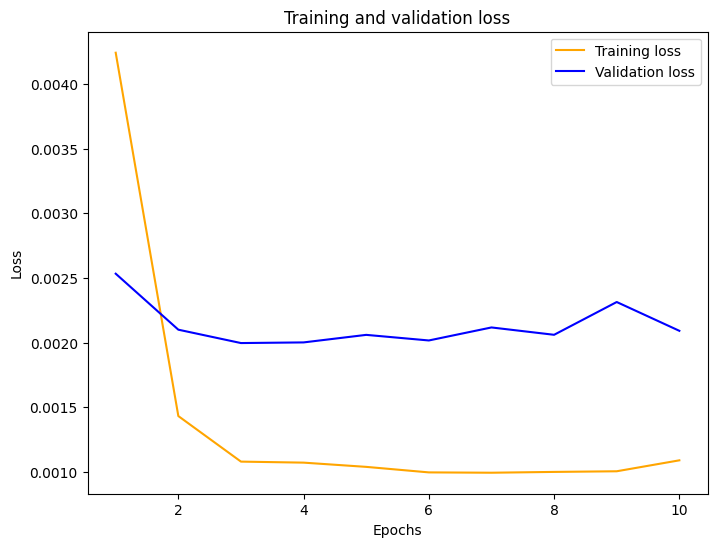

In [51]:
plot_curve(hist_001)

In [52]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.552340,0.572877,0.562693
1,2021-12-10 15:25:00,0.588,0.536828,0.550299,0.544015
2,2021-12-10 15:26:00,0.566,0.596869,0.620029,0.601686
3,2021-12-10 15:27:00,0.562,0.568668,0.572293,0.566967
4,2021-12-10 15:28:00,0.612,0.565224,0.581529,0.568688
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172678,0.171658,0.172599
3009,2021-12-16 13:59:00,0.169,0.172585,0.172241,0.172841
3010,2021-12-16 14:00:00,0.147,0.173561,0.173663,0.173950
3011,2021-12-16 14:01:00,0.145,0.153278,0.144032,0.149725


In [53]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [54]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.0020802689835247015


,Model,MSE error
0,model,0.002086
1,model_1,0.002080


In [55]:
data = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_001}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\2115983144.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [56]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 6s 7ms/step - loss: 0.0058 - val_loss: 0.0029
Epoch 2/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 3/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 4/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 5/10
377/377 [==============================] - 2s 5ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 2s 6ms/step - loss: 9.9612e-04 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 2s 6ms/step - loss: 9.8066e-04 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 5s 15ms/step - loss: 9.9143e-04 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 7s 18ms/step - loss: 9.8898e-04 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0010

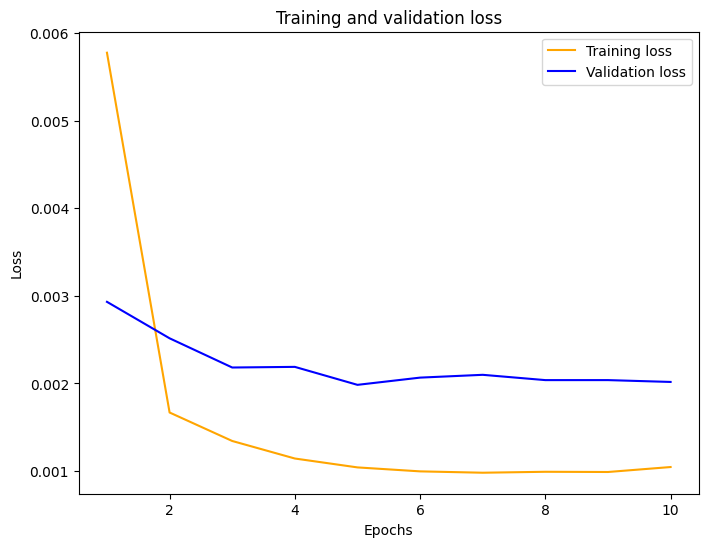

In [57]:
plot_curve(hist_0005)

In [58]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 2s 9ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.552340,0.572877,0.562693,0.557260
1,2021-12-10 15:25:00,0.588,0.536828,0.550299,0.544015,0.537858
2,2021-12-10 15:26:00,0.566,0.596869,0.620029,0.601686,0.592076
3,2021-12-10 15:27:00,0.562,0.568668,0.572293,0.566967,0.558631
4,2021-12-10 15:28:00,0.612,0.565224,0.581529,0.568688,0.560850
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172678,0.171658,0.172599,0.168613
3009,2021-12-16 13:59:00,0.169,0.172585,0.172241,0.172841,0.168692
3010,2021-12-16 14:00:00,0.147,0.173561,0.173663,0.173950,0.169651
3011,2021-12-16 14:01:00,0.145,0.153278,0.144032,0.149725,0.148040


In [59]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [60]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_001,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0020072719677408633


,Model,MSE error
0,model,0.002080
1,model_1,0.002007


In [61]:
data5 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_0005}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\1150103106.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080
6,5,Adam,32,0.005,50,,,,,1,10,0.002007


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [62]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 23s 28ms/step - loss: 0.0114 - val_loss: 0.0035
Epoch 2/10
377/377 [==============================] - 9s 24ms/step - loss: 0.0022 - val_loss: 0.0033
Epoch 3/10
377/377 [==============================] - 6s 16ms/step - loss: 0.0021 - val_loss: 0.0031
Epoch 4/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 5/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 6/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0011 - val_l

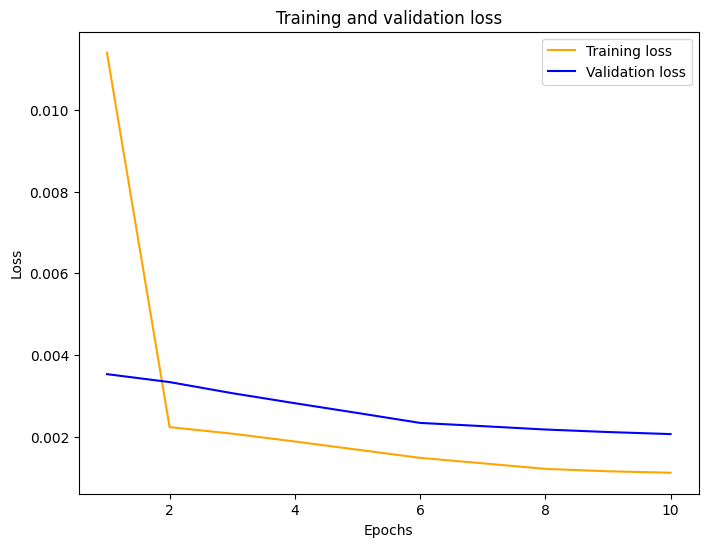

In [63]:
plot_curve(hist_0001)

In [64]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 1s 7ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.552340,0.572877,0.562693,0.557260,0.562693
1,2021-12-10 15:25:00,0.588,0.536828,0.550299,0.544015,0.537858,0.544015
2,2021-12-10 15:26:00,0.566,0.596869,0.620029,0.601686,0.592076,0.601686
3,2021-12-10 15:27:00,0.562,0.568668,0.572293,0.566967,0.558631,0.566967
4,2021-12-10 15:28:00,0.612,0.565224,0.581529,0.568688,0.560850,0.568688
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172678,0.171658,0.172599,0.168613,0.172599
3009,2021-12-16 13:59:00,0.169,0.172585,0.172241,0.172841,0.168692,0.172841
3010,2021-12-16 14:00:00,0.147,0.173561,0.173663,0.173950,0.169651,0.173950
3011,2021-12-16 14:01:00,0.145,0.153278,0.144032,0.149725,0.148040,0.149725


In [65]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [66]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_0001)

Better MSE value is :  0.0020072719677408633


,Model,MSE error
0,model,0.002007
1,model_1,0.002080


In [67]:
data6 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_0001}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\680079513.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080
6,5,Adam,32,0.005,50,,,,,1,10,0.002007
7,5,Adam,32,0.001,50,,,,,1,10,0.002080


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [68]:
test3 = test.copy()

In [69]:
test3['LSTM_50'] = predict_0005

In [70]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 20s 22ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 2/10
377/377 [==============================] - 10s 26ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 3/10
377/377 [==============================] - 10s 27ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 10s 26ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 5/10
377/377 [==============================] - 11s 28ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 10s 26ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 7/10
377/377 [==============================] - 8s 21ms/step - loss: 9.8303e-04 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 7s 20ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 7s 19ms/step - loss: 0.0010 - val_loss: 0.0024
Epoch 10/10
377/377 [==============================] - 11s 30ms/step - loss: 0.00

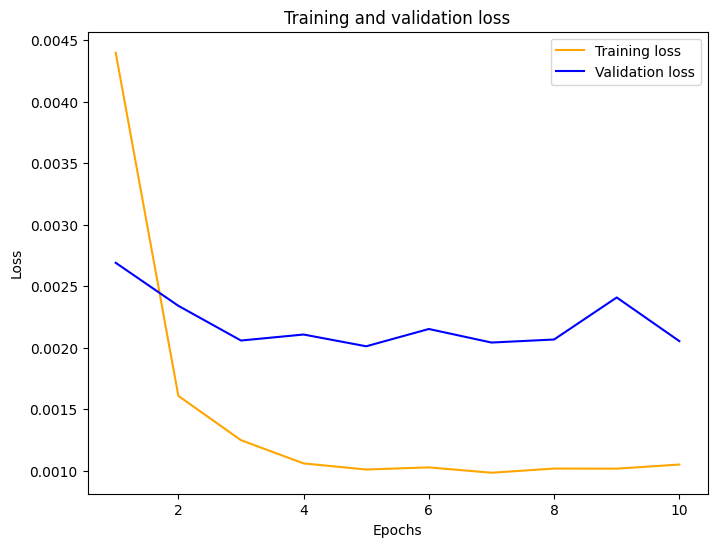

In [71]:
plot_curve(hist_1)

In [72]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 4s 14ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.557260,0.553180
1,2021-12-10 15:25:00,0.588,0.537858,0.536432
2,2021-12-10 15:26:00,0.566,0.592076,0.592760
3,2021-12-10 15:27:00,0.562,0.558631,0.562955
4,2021-12-10 15:28:00,0.612,0.560850,0.561221
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168613,0.166858
3009,2021-12-16 13:59:00,0.169,0.168692,0.166876
3010,2021-12-16 14:00:00,0.147,0.169651,0.167993
3011,2021-12-16 14:01:00,0.145,0.148040,0.145081


In [73]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [74]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_unit_100)

Better MSE value is :  0.0020072719677408633


,Model,MSE error
0,model,0.002007
1,model_1,0.002043


In [75]:
data7 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_100}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\3856756386.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080
6,5,Adam,32,0.005,50,,,,,1,10,0.002007
7,5,Adam,32,0.001,50,,,,,1,10,0.002080
8,5,Adam,32,0.005,100,,,,,1,10,0.002043


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [76]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 20s 20ms/step - loss: 0.0067 - val_loss: 0.0029
Epoch 2/10
377/377 [==============================] - 7s 20ms/step - loss: 0.0025 - val_loss: 0.0030
Epoch 3/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0022 - val_loss: 0.0024
Epoch 4/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0019 - val_loss: 0.0023
Epoch 5/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0017 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0015 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0015 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 6s 15ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 6s 17ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0013 - val_l

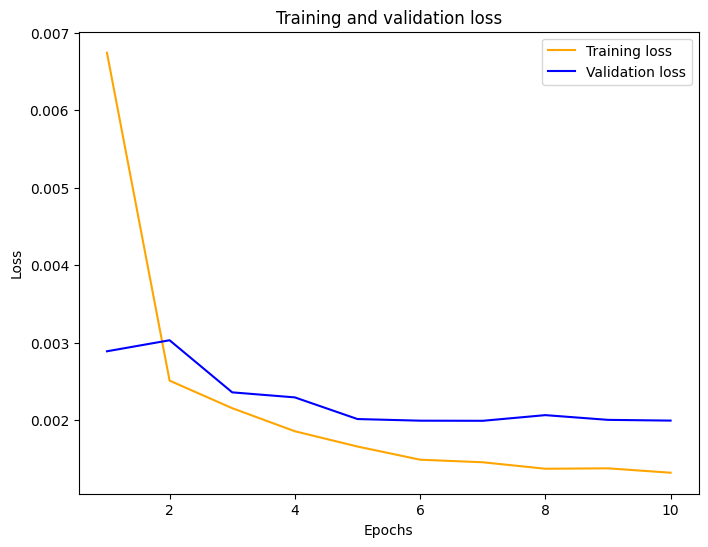

In [77]:
plot_curve(hist_2)

In [78]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 5s 9ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.557260,0.553180,0.566234
1,2021-12-10 15:25:00,0.588,0.537858,0.536432,0.546068
2,2021-12-10 15:26:00,0.566,0.592076,0.592760,0.594669
3,2021-12-10 15:27:00,0.562,0.558631,0.562955,0.567256
4,2021-12-10 15:28:00,0.612,0.560850,0.561221,0.568004
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168613,0.166858,0.170576
3009,2021-12-16 13:59:00,0.169,0.168692,0.166876,0.170497
3010,2021-12-16 14:00:00,0.147,0.169651,0.167993,0.171472
3011,2021-12-16 14:01:00,0.145,0.148040,0.145081,0.150619


In [79]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [80]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_50_drop_out)

Better MSE value is :  0.0019869002729590666


,Model,MSE error
0,model,0.002007
1,model_1,0.001987


In [81]:
data8 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':0.1, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_50_drop_out}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\449715907.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080
6,5,Adam,32,0.005,50,,,,,1,10,0.002007
7,5,Adam,32,0.001,50,,,,,1,10,0.002080
8,5,Adam,32,0.005,100,,,,,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,,,,1,10,0.001987


------------------------------------

### Add frist layer: units = 50 and Add Dropout = 0.2

In [82]:
model_6 = Sequential()
model_6.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_6.add(Dropout(0.2))
model_6.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_6.compile(optimizer = opt, loss = 'mean_squared_error')
hist_6 = model_6.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 9ms/step - loss: 0.0083 - val_loss: 0.0028
Epoch 2/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0032 - val_loss: 0.0025
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 4/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0023 - val_loss: 0.0023
Epoch 5/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0021 - val_loss: 0.0021
Epoch 6/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0019 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 9/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 2s 6ms/step - loss: 0.0017 - val_loss: 0.0021

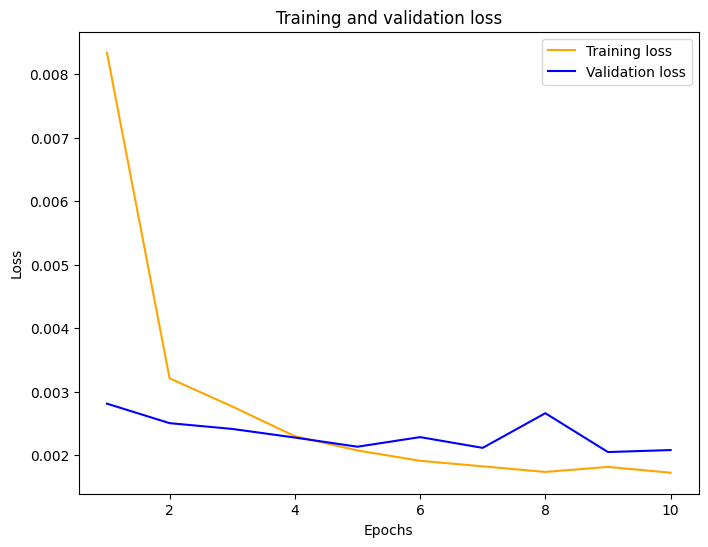

In [83]:
plot_curve(hist_6)

In [84]:
predict_scaled_6 = model_6.predict(X_test)
predict_6 = sc.inverse_transform(predict_scaled_6)
test3['LSTM_Drop_out 0.2'] = predict_6
test3

95/95 [==============================] - 2s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_Drop_out 0.2
0,2021-12-10 15:24:00,0.538,0.557260,0.553180,0.566234,0.544778
1,2021-12-10 15:25:00,0.588,0.537858,0.536432,0.546068,0.525987
2,2021-12-10 15:26:00,0.566,0.592076,0.592760,0.594669,0.575144
3,2021-12-10 15:27:00,0.562,0.558631,0.562955,0.567256,0.553095
4,2021-12-10 15:28:00,0.612,0.560850,0.561221,0.568004,0.551848
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168613,0.166858,0.170576,0.172409
3009,2021-12-16 13:59:00,0.169,0.168692,0.166876,0.170497,0.172222
3010,2021-12-16 14:00:00,0.147,0.169651,0.167993,0.171472,0.173207
3011,2021-12-16 14:01:00,0.145,0.148040,0.145081,0.150619,0.152501


In [85]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out 0.2'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [86]:
lstm_mse_error_50_drop_out_02 = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out 0.2'], squared=True)
compare_mse_model(lstm_mse_error_50_drop_out,lstm_mse_error_50_drop_out_02)

Better MSE value is :  0.0019869002729590666


,Model,MSE error
0,model,0.001987
1,model_1,0.002070


In [87]:
data9 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':0.2, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_50_drop_out_02}]

mse_data = mse_data.append(data9,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\1795088018.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080
6,5,Adam,32,0.005,50,,,,,1,10,0.002007
7,5,Adam,32,0.001,50,,,,,1,10,0.002080
8,5,Adam,32,0.005,100,,,,,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,,,,1,10,0.001987


------------------------------------

### Add frist layer: units = 50 drop out 0.1 and Add second layer: unit = 50

In [88]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(Dropout(0.1))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 17s 24ms/step - loss: 0.0065 - val_loss: 0.0033
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0022 - val_loss: 0.0025
Epoch 3/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0016 - val_loss: 0.0023
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 10/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.00

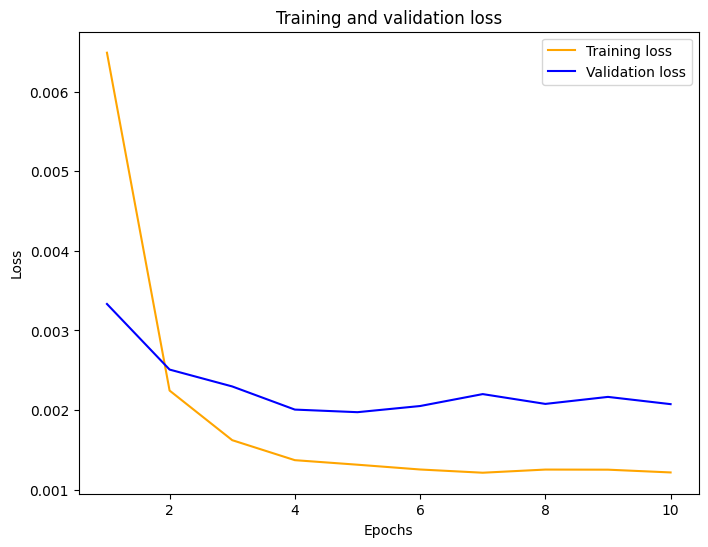

In [89]:
plot_curve(hist_3)

In [90]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 2s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_Drop_out 0.2,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.557260,0.553180,0.566234,0.544778,0.566721
1,2021-12-10 15:25:00,0.588,0.537858,0.536432,0.546068,0.525987,0.549822
2,2021-12-10 15:26:00,0.566,0.592076,0.592760,0.594669,0.575144,0.600226
3,2021-12-10 15:27:00,0.562,0.558631,0.562955,0.567256,0.553095,0.575702
4,2021-12-10 15:28:00,0.612,0.560850,0.561221,0.568004,0.551848,0.570454
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168613,0.166858,0.170576,0.172409,0.172871
3009,2021-12-16 13:59:00,0.169,0.168692,0.166876,0.170497,0.172222,0.172785
3010,2021-12-16 14:00:00,0.147,0.169651,0.167993,0.171472,0.173207,0.174109
3011,2021-12-16 14:01:00,0.145,0.148040,0.145081,0.150619,0.152501,0.150879


In [91]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [92]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_50_drop_out,lstm_mse_error_second_layer)

Better MSE value is :  0.0019869002729590666


,Model,MSE error
0,model,0.001987
1,model_1,0.002063


In [93]:
data10 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':0.1, 'The second layer':50, 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_second_layer}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\1396338768.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080
6,5,Adam,32,0.005,50,,,,,1,10,0.002007
7,5,Adam,32,0.001,50,,,,,1,10,0.002080
8,5,Adam,32,0.005,100,,,,,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,,,,1,10,0.001987


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [108]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
377/377 [==============================] - 6s 7ms/step - loss: 0.0038 - val_loss: 0.0027
Epoch 2/20
377/377 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 3/20
377/377 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 4/20
377/377 [==============================] - 2s 5ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/20
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/20
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 7/20
377/377 [==============================] - 2s 5ms/step - loss: 9.9613e-04 - val_loss: 0.0020
Epoch 8/20
377/377 [==============================] - 2s 5ms/step - loss: 9.9445e-04 - val_loss: 0.0020
Epoch 9/20
377/377 [==============================] - 2s 4ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/20
377/377 [==============================] - 2s 4ms/step - loss: 9.8273e-04 - val_

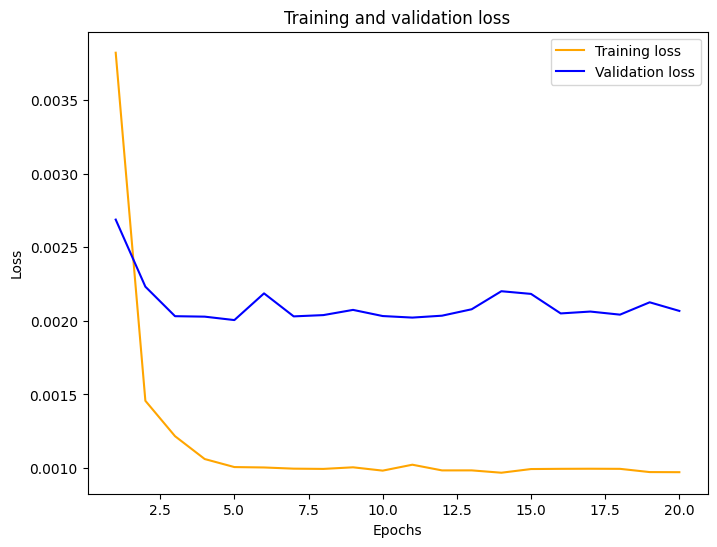

In [109]:
plot_curve(hist_5)

In [110]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_Drop_out 0.2,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.557260,0.553180,0.566234,0.544778,0.566721,0.553508
1,2021-12-10 15:25:00,0.588,0.537858,0.536432,0.546068,0.525987,0.549822,0.533319
2,2021-12-10 15:26:00,0.566,0.592076,0.592760,0.594669,0.575144,0.600226,0.588645
3,2021-12-10 15:27:00,0.562,0.558631,0.562955,0.567256,0.553095,0.575702,0.554992
4,2021-12-10 15:28:00,0.612,0.560850,0.561221,0.568004,0.551848,0.570454,0.557863
...,...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168613,0.166858,0.170576,0.172409,0.172871,0.162460
3009,2021-12-16 13:59:00,0.169,0.168692,0.166876,0.170497,0.172222,0.172785,0.162904
3010,2021-12-16 14:00:00,0.147,0.169651,0.167993,0.171472,0.173207,0.174109,0.163866
3011,2021-12-16 14:01:00,0.145,0.148040,0.145081,0.150619,0.152501,0.150879,0.139742


In [111]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [112]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
compare_mse_model(lstm_mse_error_50_drop_out,lstm_mse_error_unit_50_epoch20)

Better MSE value is :  0.0019869002729590666


,Model,MSE error
0,model,0.001987
1,model_1,0.002057


In [113]:
data11 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':0.1, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':20 ,'mse error':lstm_mse_error_unit_50_epoch20}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17816\4107800063.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,,50,,,,,1,10,0.002086
1,5,RMSprop,32,,50,,,,,1,10,0.002107
2,5,Adam,64,,50,,,,,1,10,0.002431
3,5,Adam,32,0.1,50,,,,,1,10,0.002102
4,5,Adam,32,0.05,50,,,,,1,10,0.002492
5,5,Adam,32,0.01,50,,,,,1,10,0.002080
6,5,Adam,32,0.005,50,,,,,1,10,0.002007
7,5,Adam,32,0.001,50,,,,,1,10,0.002080
8,5,Adam,32,0.005,100,,,,,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,,,,1,10,0.001987


---

# save model

In [114]:
mse_data.to_csv('data_lstm_mse.csv',index=False)

In [116]:
mse_lstm = pd.read_csv('data_lstm_mse.csv')

In [117]:
mse = mse_lstm.groupby(['Lags'])['mse error'].transform(min) == mse_lstm['mse error']
mse_lstm[mse]

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [ ]:
model_2.save('model_train_80%_lag5.h5')